<a href="https://colab.research.google.com/github/vanesamrd/PCVK_Ganjil_2026/blob/main/P3_25_Vanesa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [30]:
import sys, platform, hashlib, datetime, zoneinfo
import pandas as pd

NAMA = 'Vanesa Mardiana Putri'
NIM = '244107020129'

N = int(NIM[-3:])

PARAM = {
    'b': (N % 61) + 20,
    'a': round(1.0 + (N % 9) / 10, 1),
    'c': (N % 20) + 30,
    'gamma': round(0.4 + (N % 6) * 0.25, 2),
    'bit': (N % 6) + 2,
}

waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))

print('NAMA :', NAMA)
print('NIM :', NIM, '| N =', N)

for k, v in PARAM.items():
    print('%-6s :' % k, v)

print('WAKTU :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())

kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA : Vanesa Mardiana Putri
NIM : 244107020129 | N = 129
b      : 27
a      : 1.3
c      : 39
gamma  : 1.15
bit    : 5
WAKTU : 2026-09-18 23:15:38 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN : f3075dc159cdea5b


In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

print("Library berhasil di-load")

Library berhasil di-load


In [3]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
BASE = '/content/drive/MyDrive/pcvk_vanesa/Images/' + NIM

print(BASE)

print(os.listdir(BASE))

/content/drive/MyDrive/pcvk_vanesa/Images/244107020129
['NIGHT1.jpg', 'OBJ1.jpg', 'KTM1a.jpg', 'KTM1b.jpg', 'KTM1c.jpg', 'KTM1d.jpg']


In [6]:
files = [
    'KTM1a.jpg',
    'KTM1b.jpg',
    'KTM1c.jpg',
    'KTM1d.jpg',
    'OBJ1.jpg',
    'NIGHT1.jpg'
]

for file in files:
    path = os.path.join(BASE, file)
    img = cv.imread(path)

    if img is None:
        print(file, '❌ TIDAK DITEMUKAN')
    else:
        print(file, '✅', img.shape)

KTM1a.jpg ✅ (833, 1280, 3)
KTM1b.jpg ✅ (803, 1280, 3)
KTM1c.jpg ✅ (689, 1101, 3)
KTM1d.jpg ✅ (997, 1600, 3)
OBJ1.jpg ✅ (1600, 1200, 3)
NIGHT1.jpg ✅ (1600, 1355, 3)


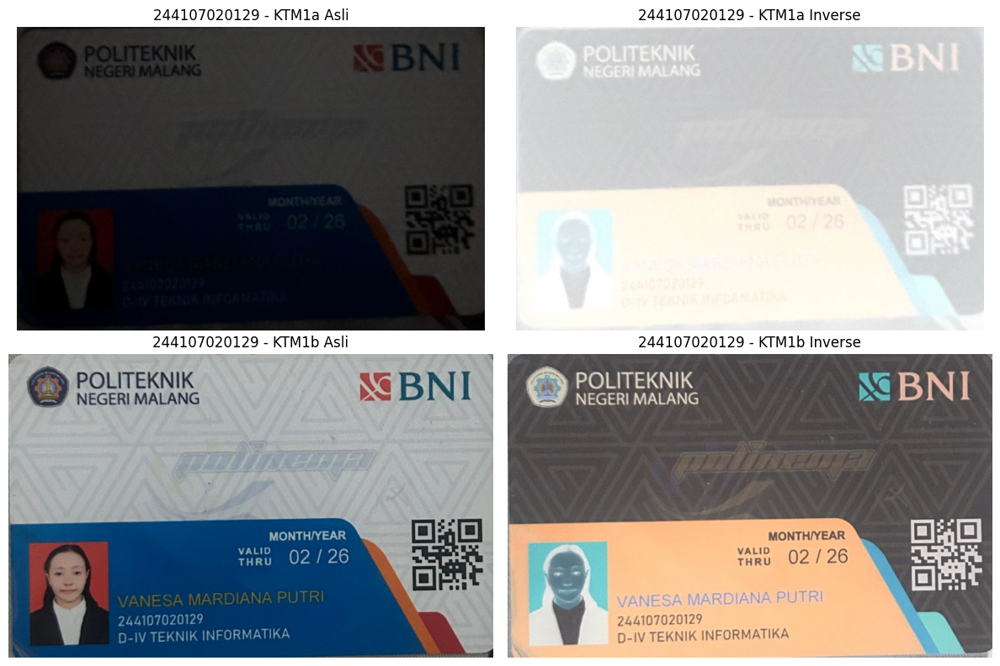

In [7]:
# ============================================
# STEP 7 - TUGAS 1: INVERSE CITRA
# ============================================

# Membaca citra KTM1a dan KTM1b
img_KTM1a = cv.imread(os.path.join(BASE, 'KTM1a.jpg'))
img_KTM1b = cv.imread(os.path.join(BASE, 'KTM1b.jpg'))

# Mengubah BGR menjadi RGB
img_KTM1a_rgb = cv.cvtColor(img_KTM1a, cv.COLOR_BGR2RGB)
img_KTM1b_rgb = cv.cvtColor(img_KTM1b, cv.COLOR_BGR2RGB)

# Proses inverse
# Rumus: g = 255 - f
inverse_KTM1a = 255 - img_KTM1a_rgb
inverse_KTM1b = 255 - img_KTM1b_rgb

# Menampilkan hasil
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(img_KTM1a_rgb)
plt.title(NIM + ' - KTM1a Asli')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(inverse_KTM1a)
plt.title(NIM + ' - KTM1a Inverse')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(img_KTM1b_rgb)
plt.title(NIM + ' - KTM1b Asli')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(inverse_KTM1b)
plt.title(NIM + ' - KTM1b Inverse')
plt.axis('off')

plt.tight_layout()
plt.show()

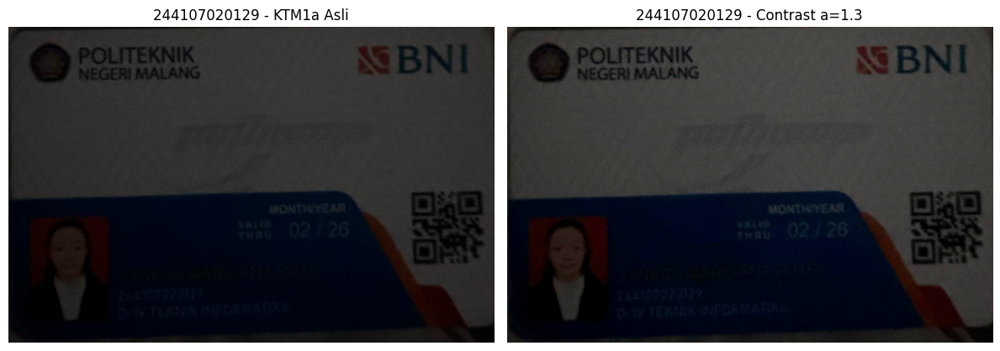

In [8]:
img_KTM1a = cv.imread(os.path.join(BASE, 'KTM1a.jpg'))
img_KTM1a_rgb = cv.cvtColor(img_KTM1a, cv.COLOR_BGR2RGB)

a = PARAM['a']

contrast_KTM1a = a * img_KTM1a_rgb.astype(np.float32)
contrast_KTM1a = np.clip(contrast_KTM1a, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_KTM1a_rgb)
plt.title(NIM + ' - KTM1a Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(contrast_KTM1a)
plt.title(NIM + ' - Contrast a=' + str(a))
plt.axis('off')

plt.tight_layout()
plt.show()

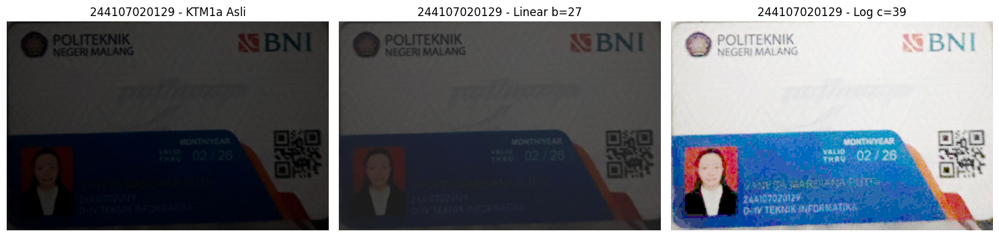

In [9]:
img_KTM1a = cv.imread(os.path.join(BASE, 'KTM1a.jpg'))
img_KTM1a_rgb = cv.cvtColor(img_KTM1a, cv.COLOR_BGR2RGB)

b = PARAM['b']
c = PARAM['c']

linear = img_KTM1a_rgb.astype(np.int16) + b
linear = np.clip(linear, 0, 255).astype(np.uint8)

img_float = img_KTM1a_rgb.astype(np.float32)

log_image = c * np.log1p(img_float)
log_image = cv.normalize(log_image, None, 0, 255, cv.NORM_MINMAX)
log_image = log_image.astype(np.uint8)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_KTM1a_rgb)
plt.title(NIM + ' - KTM1a Asli')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(linear)
plt.title(NIM + ' - Linear b=' + str(b))
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(log_image)
plt.title(NIM + ' - Log c=' + str(c))
plt.axis('off')

plt.tight_layout()
plt.show()

In [10]:
linear_white = np.all(linear == 255, axis=2)
log_white = np.all(log_image == 255, axis=2)

linear_count = np.sum(linear_white)
log_count = np.sum(log_white)

total_pixel = linear.shape[0] * linear.shape[1]

print('Linear brightness')
print('Jumlah piksel putih penuh:', linear_count)
print('Persentase:', round(linear_count / total_pixel * 100, 2), '%')

print()

print('Logarithmic brightness')
print('Jumlah piksel putih penuh:', log_count)
print('Persentase:', round(log_count / total_pixel * 100, 2), '%')

Linear brightness
Jumlah piksel putih penuh: 0
Persentase: 0.0 %

Logarithmic brightness
Jumlah piksel putih penuh: 0
Persentase: 0.0 %


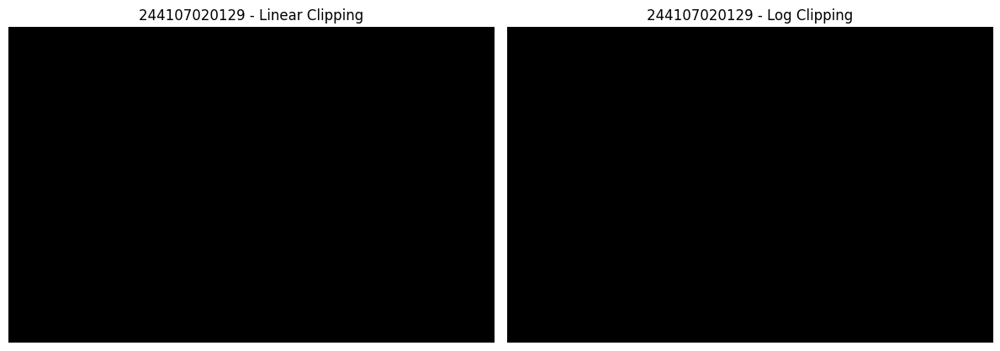

In [11]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(linear_white, cmap='gray')
plt.title(NIM + ' - Linear Clipping')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(log_white, cmap='gray')
plt.title(NIM + ' - Log Clipping')
plt.axis('off')

plt.tight_layout()
plt.show()

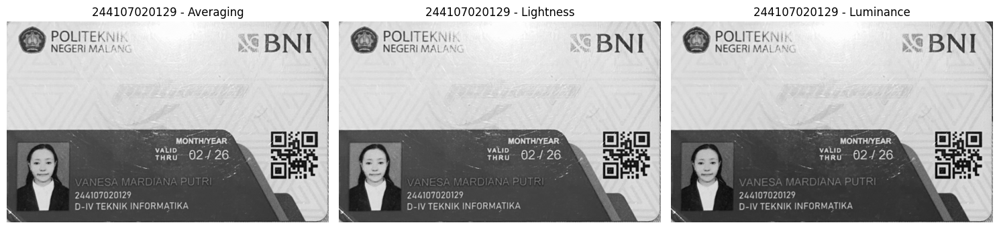

In [12]:
img_KTM1c = cv.imread(os.path.join(BASE, 'KTM1c.jpg'))
img_KTM1c_rgb = cv.cvtColor(img_KTM1c, cv.COLOR_BGR2RGB)

r = img_KTM1c_rgb[:, :, 0].astype(np.float32)
g = img_KTM1c_rgb[:, :, 1].astype(np.float32)
b = img_KTM1c_rgb[:, :, 2].astype(np.float32)

averaging = (r + g + b) / 3
lightness = (np.maximum.reduce([r, g, b]) + np.minimum.reduce([r, g, b])) / 2
luminance = 0.21 * r + 0.72 * g + 0.07 * b

averaging = averaging.astype(np.uint8)
lightness = lightness.astype(np.uint8)
luminance = luminance.astype(np.uint8)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(averaging, cmap='gray')
plt.title(NIM + ' - Averaging')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(lightness, cmap='gray')
plt.title(NIM + ' - Lightness')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(luminance, cmap='gray')
plt.title(NIM + ' - Luminance')
plt.axis('off')

plt.tight_layout()
plt.show()

In [31]:
import pandas as pd

gray_table = pd.DataFrame({
    'Metode': ['Averaging', 'Lightness', 'Luminance'],
    'Mean': [
        np.mean(averaging),
        np.mean(lightness),
        np.mean(luminance)
    ],
    'Std': [
        np.std(averaging),
        np.std(lightness),
        np.std(luminance)
    ]
})

gray_table

,Metode,Mean,Std
0,Averaging,161.856884,73.780893
1,Lightness,163.361856,73.456390
2,Luminance,156.965253,77.113711


Hue dominan: 16
HSV narrow: [ 6 80 50] [ 26 255 255]


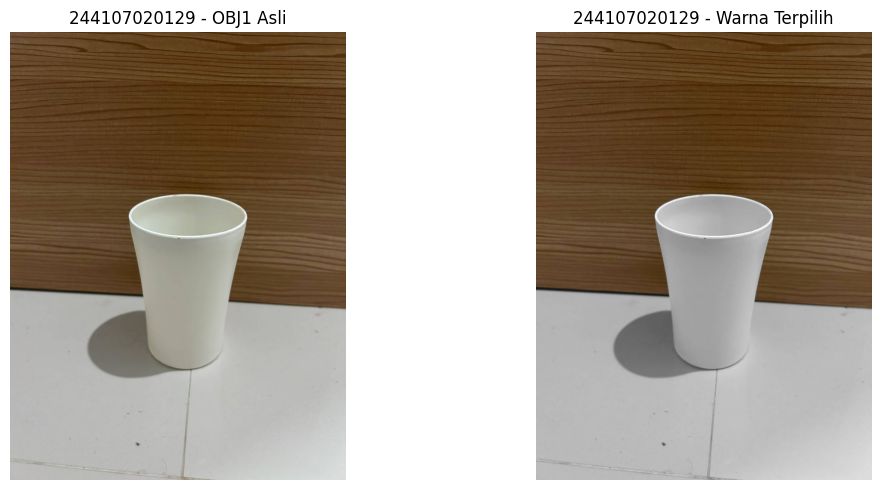

In [14]:
img_OBJ1 = cv.imread(os.path.join(BASE, 'OBJ1.jpg'))
img_OBJ1_rgb = cv.cvtColor(img_OBJ1, cv.COLOR_BGR2RGB)

hsv = cv.cvtColor(img_OBJ1, cv.COLOR_BGR2HSV)

hue = hsv[:, :, 0]
saturation = hsv[:, :, 1]
value = hsv[:, :, 2]

valid_hue = hue[saturation > 80]

dominant_hue = int(np.median(valid_hue))

lower_narrow = np.array([
    max(dominant_hue - 10, 0),
    80,
    50
])

upper_narrow = np.array([
    min(dominant_hue + 10, 179),
    255,
    255
])

mask_narrow = cv.inRange(hsv, lower_narrow, upper_narrow)

result_narrow = cv.bitwise_and(
    img_OBJ1_rgb,
    img_OBJ1_rgb,
    mask=mask_narrow
)

gray_OBJ1 = cv.cvtColor(img_OBJ1, cv.COLOR_BGR2GRAY)
gray_OBJ1_rgb = cv.cvtColor(gray_OBJ1, cv.COLOR_GRAY2RGB)

result_gray = gray_OBJ1_rgb.copy()
result_gray[mask_narrow > 0] = img_OBJ1_rgb[mask_narrow > 0]

print('Hue dominan:', dominant_hue)
print('HSV narrow:', lower_narrow, upper_narrow)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_OBJ1_rgb)
plt.title(NIM + ' - OBJ1 Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result_gray)
plt.title(NIM + ' - Warna Terpilih')
plt.axis('off')

plt.tight_layout()
plt.show()

HSV wide: [ 0 50 40] [ 41 255 255]


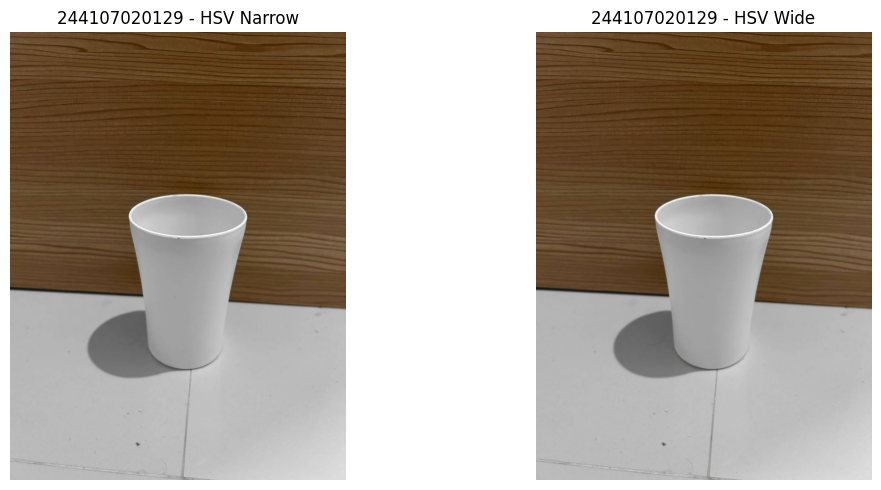

In [15]:
lower_wide = np.array([
    max(dominant_hue - 25, 0),
    50,
    40
])

upper_wide = np.array([
    min(dominant_hue + 25, 179),
    255,
    255
])

mask_wide = cv.inRange(hsv, lower_wide, upper_wide)

result_wide = gray_OBJ1_rgb.copy()
result_wide[mask_wide > 0] = img_OBJ1_rgb[mask_wide > 0]

print('HSV wide:', lower_wide, upper_wide)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(result_gray)
plt.title(NIM + ' - HSV Narrow')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result_wide)
plt.title(NIM + ' - HSV Wide')
plt.axis('off')

plt.tight_layout()
plt.show()

HSV tight: [ 11 120  80] [ 21 255 255]


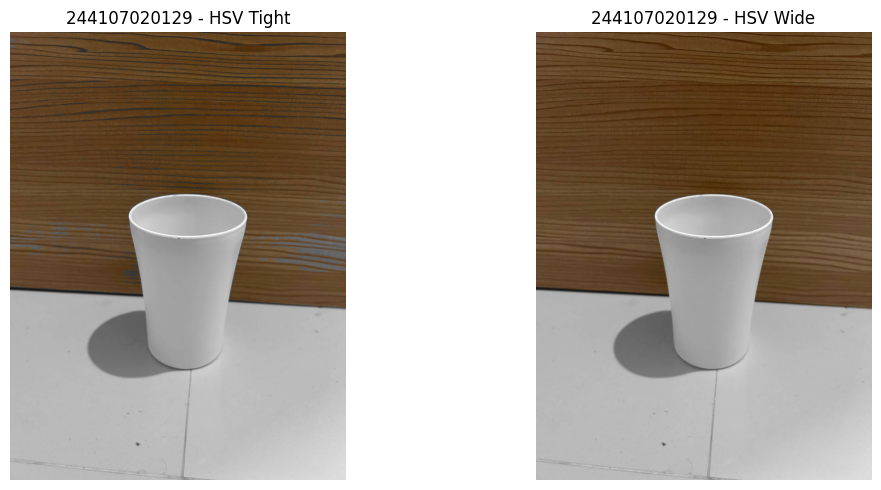

In [16]:
lower_tight = np.array([
    max(dominant_hue - 5, 0),
    120,
    80
])

upper_tight = np.array([
    min(dominant_hue + 5, 179),
    255,
    255
])

mask_tight = cv.inRange(hsv, lower_tight, upper_tight)

result_tight = gray_OBJ1_rgb.copy()
result_tight[mask_tight > 0] = img_OBJ1_rgb[mask_tight > 0]

print('HSV tight:', lower_tight, upper_tight)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(result_tight)
plt.title(NIM + ' - HSV Tight')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result_wide)
plt.title(NIM + ' - HSV Wide')
plt.axis('off')

plt.tight_layout()
plt.show()

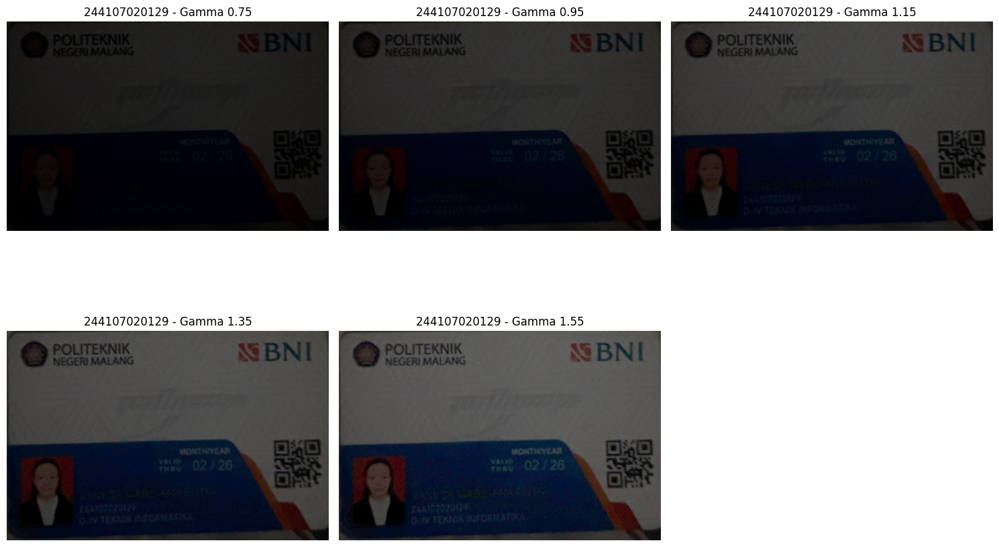

In [17]:
img_KTM1a = cv.imread(os.path.join(BASE, 'KTM1a.jpg'))
img_KTM1a_rgb = cv.cvtColor(img_KTM1a, cv.COLOR_BGR2RGB)

gamma_values = [
    PARAM['gamma'] - 0.4,
    PARAM['gamma'] - 0.2,
    PARAM['gamma'],
    PARAM['gamma'] + 0.2,
    PARAM['gamma'] + 0.4
]

gamma_values = [round(max(value, 0.1), 2) for value in gamma_values]

gamma_images = []

for gamma in gamma_values:
    normalized = img_KTM1a_rgb.astype(np.float32) / 255.0
    corrected = 255 * (normalized ** (1 / gamma))
    corrected = np.clip(corrected, 0, 255).astype(np.uint8)
    gamma_images.append(corrected)

plt.figure(figsize=(15, 10))

for i in range(len(gamma_values)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(gamma_images[i])
    plt.title(NIM + ' - Gamma ' + str(gamma_values[i]))
    plt.axis('off')

plt.tight_layout()
plt.show()

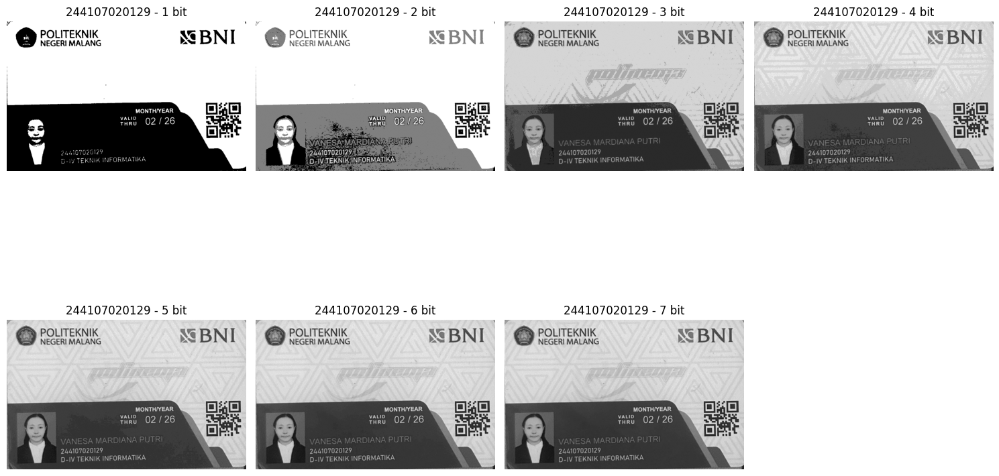

In [18]:
img_KTM1b = cv.imread(
    os.path.join(BASE, 'KTM1b.jpg'),
    cv.IMREAD_GRAYSCALE
)

depth_images = []

for bit_depth in range(1, 8):
    level = 255 / (pow(2, bit_depth) - 1)
    depth_image = np.round(img_KTM1b / level) * level
    depth_image = np.clip(depth_image, 0, 255).astype(np.uint8)
    depth_images.append(depth_image)

plt.figure(figsize=(15, 10))

for i in range(7):
    plt.subplot(2, 4, i + 1)
    plt.imshow(depth_images[i], cmap='gray')
    plt.title(NIM + ' - ' + str(i + 1) + ' bit')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [25]:
GALAXY = '/content/drive/MyDrive/pcvk_vanesa/galaxy.jpg'
NOISES = '/content/drive/MyDrive/pcvk_vanesa/noises'

original_galaxy = cv.imread(GALAXY)

noise_paths = sorted(glob.glob(NOISES + '/*'))

noise_images = []

for path in noise_paths:
    img = cv.imread(path)

    if img is not None:
        noise_images.append(img)

print('Galaxy:', original_galaxy.shape)
print('Jumlah citra noise:', len(noise_images))

Galaxy: (256, 310, 3)
Jumlah citra noise: 100


In [28]:
def PSNR(img1, img2):
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)

    mse = np.mean((img1 - img2) ** 2)

    if mse == 0:
        return float('inf')

    return 20 * np.log10(255.0 / np.sqrt(mse))

In [32]:
counts = [10, 20, 40, 80, 100]

average_images = []
psnr_values = []

for count in counts:
    selected_images = np.array(noise_images[:count], dtype=np.float32)

    average_image = np.mean(selected_images, axis=0)
    average_image = np.clip(average_image, 0, 255).astype(np.uint8)

    average_images.append(average_image)

    psnr = PSNR(original_galaxy, average_image)
    psnr_values.append(psnr)

results_psnr = pd.DataFrame({
    'Jumlah Citra': counts,
    'PSNR (dB)': psnr_values
})

results_psnr

,Jumlah Citra,PSNR (dB)
0,10,19.735622
1,20,19.840488
2,40,19.892767
3,80,19.915894
4,100,19.921961


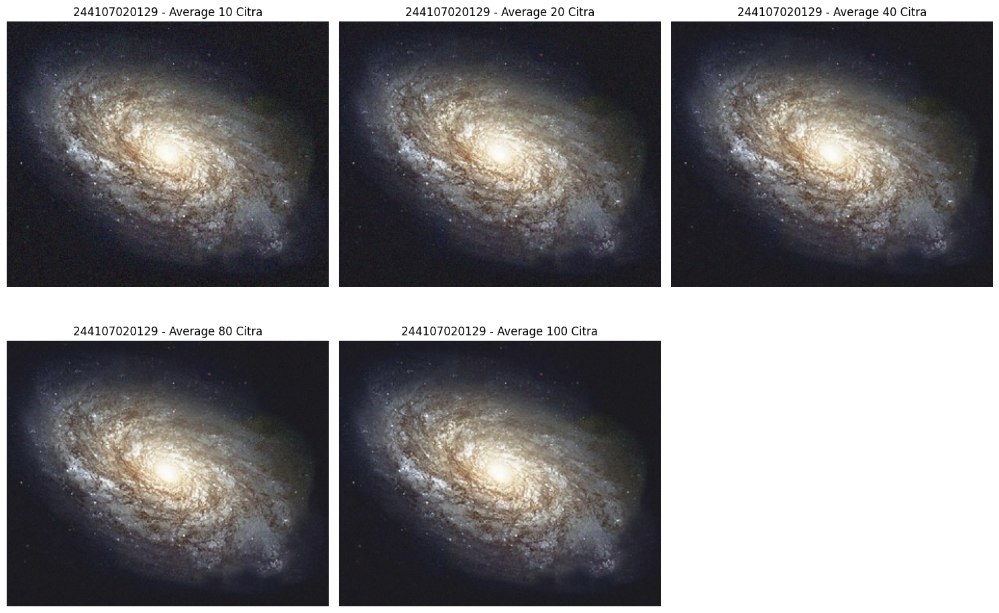

In [33]:
plt.figure(figsize=(15, 10))

for i in range(len(counts)):
    image_rgb = cv.cvtColor(
        average_images[i],
        cv.COLOR_BGR2RGB
    )

    plt.subplot(2, 3, i + 1)
    plt.imshow(image_rgb)
    plt.title(
        NIM + ' - Average ' +
        str(counts[i]) +
        ' Citra'
    )
    plt.axis('off')

plt.tight_layout()
plt.show()

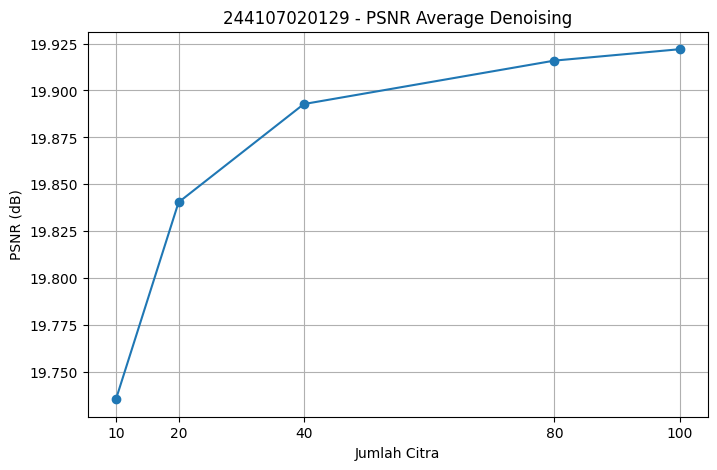

In [34]:
plt.figure(figsize=(8, 5))

plt.plot(counts, psnr_values, marker='o')
plt.xlabel('Jumlah Citra')
plt.ylabel('PSNR (dB)')
plt.title(NIM + ' - PSNR Average Denoising')
plt.xticks(counts)
plt.grid(True)
plt.show()

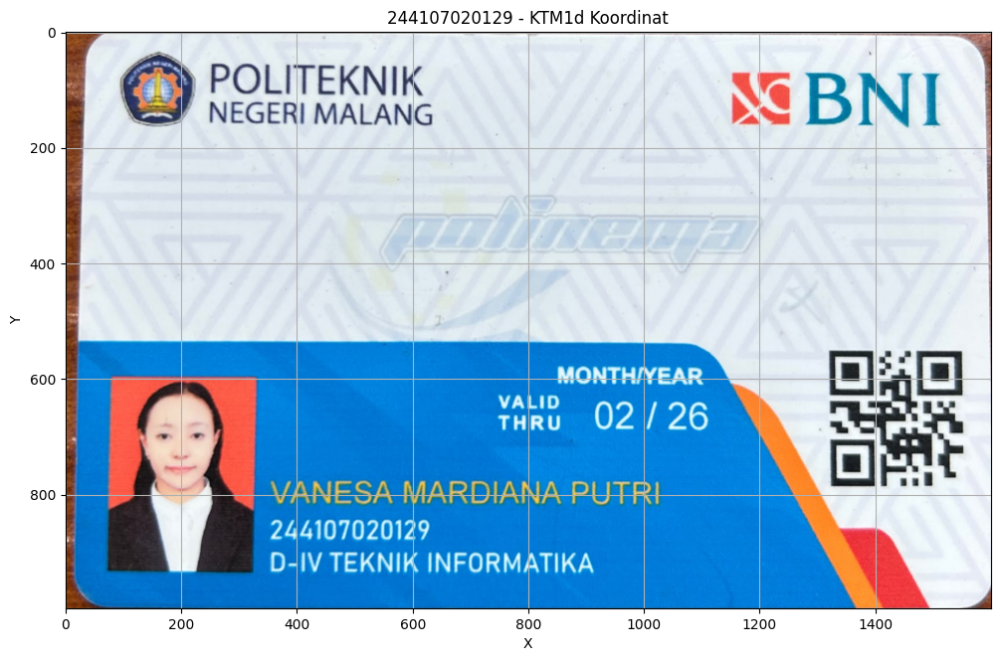

Lebar: 1600
Tinggi: 997


In [35]:
img_KTM1d = cv.imread(os.path.join(BASE, 'KTM1d.jpg'))
img_KTM1d_rgb = cv.cvtColor(img_KTM1d, cv.COLOR_BGR2RGB)

height, width = img_KTM1d.shape[:2]

plt.figure(figsize=(12, 8))
plt.imshow(img_KTM1d_rgb)
plt.title(NIM + ' - KTM1d Koordinat')
plt.xlabel('X')
plt.ylabel('Y')
plt.grid()
plt.show()

print('Lebar:', width)
print('Tinggi:', height)

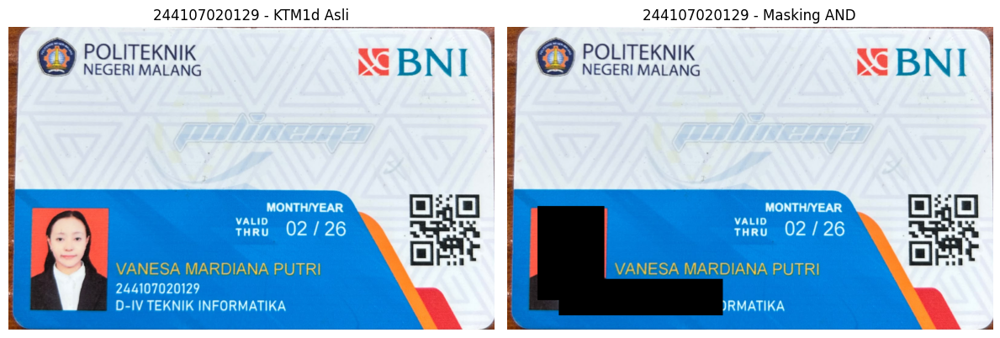

Koordinat wajah: 100 590 320 900
Koordinat NIM: 170 830 710 950


In [45]:
x1_face = 100
y1_face = 590
x2_face = 320
y2_face = 900

x1_nim = 170
y1_nim = 830
x2_nim = 710
y2_nim = 950

mask = np.zeros((height, width), dtype=np.uint8)

mask[y1_face:y2_face, x1_face:x2_face] = 255
mask[y1_nim:y2_nim, x1_nim:x2_nim] = 255

masked_image = cv.bitwise_and(
    img_KTM1d_rgb,
    img_KTM1d_rgb,
    mask=cv.bitwise_not(mask)
)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_KTM1d_rgb)
plt.title(NIM + ' - KTM1d Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_image)
plt.title(NIM + ' - Masking AND')
plt.axis('off')

plt.tight_layout()
plt.show()

print('Koordinat wajah:', x1_face, y1_face, x2_face, y2_face)
print('Koordinat NIM:', x1_nim, y1_nim, x2_nim, y2_nim)

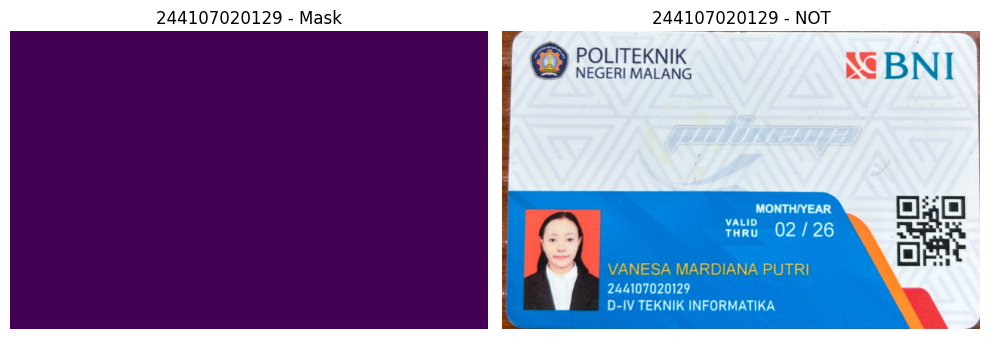

In [37]:
mask_not = cv.bitwise_not(mask)

not_result = cv.bitwise_and(
    img_KTM1d_rgb,
    img_KTM1d_rgb,
    mask=mask_not
)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(mask)
plt.title(NIM + ' - Mask')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(not_result)
plt.title(NIM + ' - NOT')
plt.axis('off')

plt.tight_layout()
plt.show()

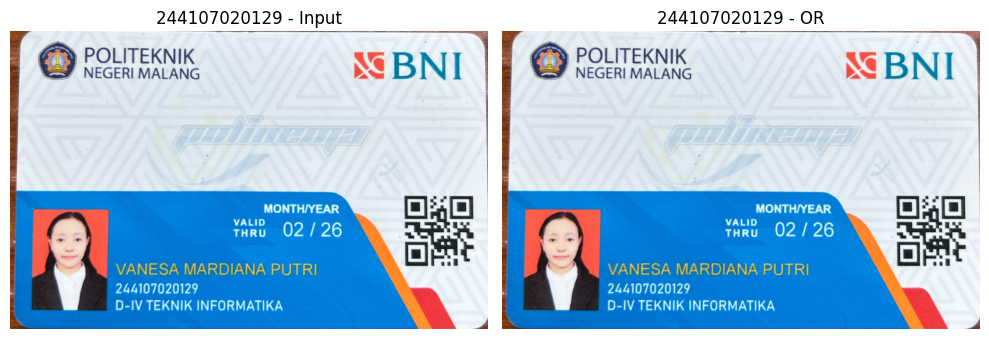

In [38]:
mask_rgb = cv.cvtColor(mask, cv.COLOR_GRAY2RGB)

or_result = cv.bitwise_or(
    img_KTM1d_rgb,
    mask_rgb
)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_KTM1d_rgb)
plt.title(NIM + ' - Input')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(or_result)
plt.title(NIM + ' - OR')
plt.axis('off')

plt.tight_layout()
plt.show()

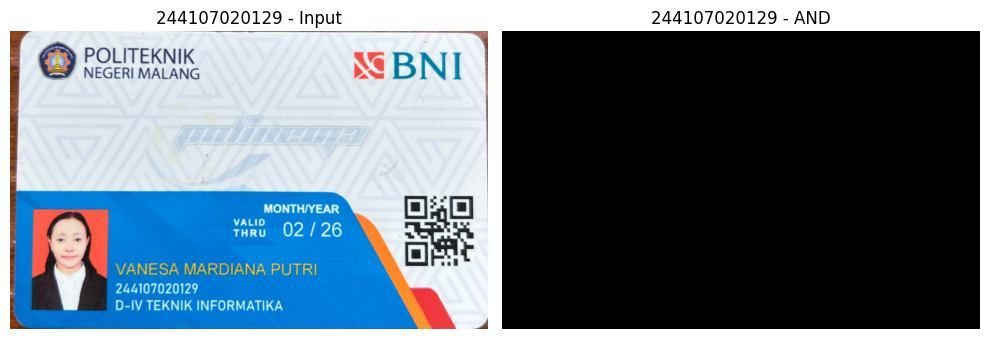

In [39]:
and_result = cv.bitwise_and(
    img_KTM1d_rgb,
    mask_rgb
)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_KTM1d_rgb)
plt.title(NIM + ' - Input')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(and_result)
plt.title(NIM + ' - AND')
plt.axis('off')

plt.tight_layout()
plt.show()

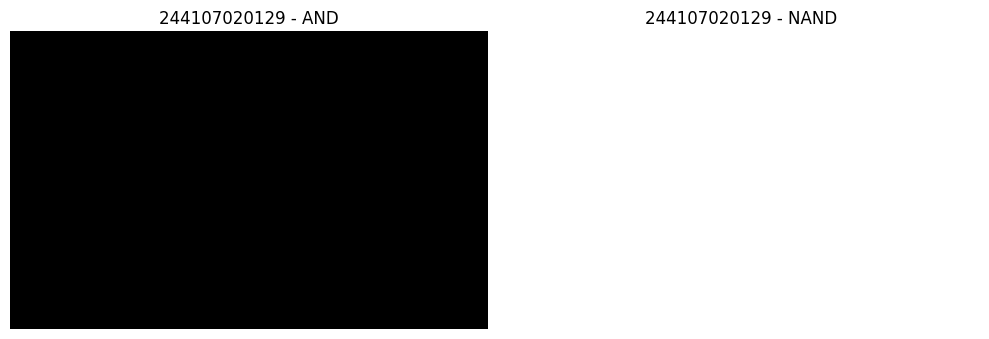

In [40]:
nand_result = cv.bitwise_not(and_result)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(and_result)
plt.title(NIM + ' - AND')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(nand_result)
plt.title(NIM + ' - NAND')
plt.axis('off')

plt.tight_layout()
plt.show()

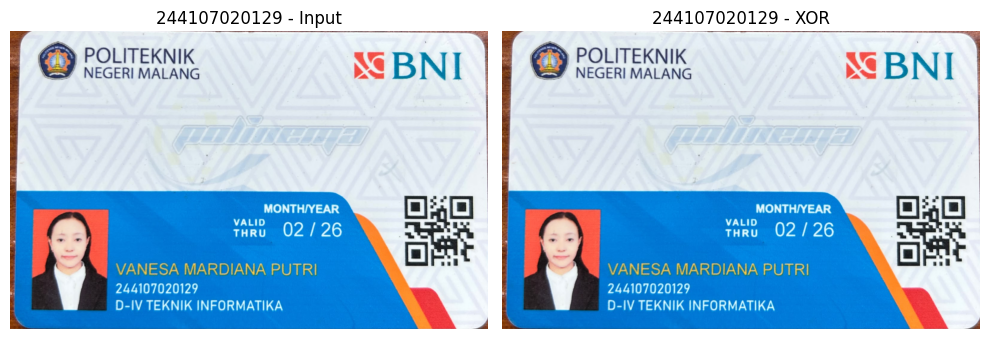

In [41]:
xor_result = cv.bitwise_xor(
    img_KTM1d_rgb,
    mask_rgb
)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_KTM1d_rgb)
plt.title(NIM + ' - Input')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(xor_result)
plt.title(NIM + ' - XOR')
plt.axis('off')

plt.tight_layout()
plt.show()

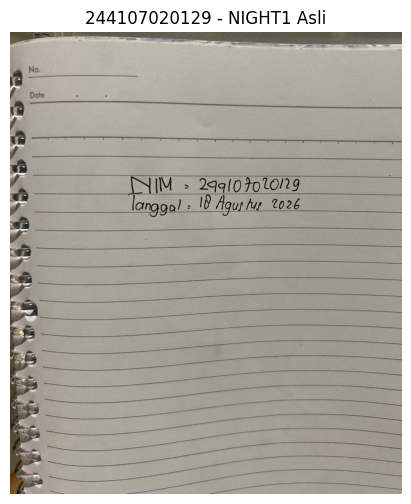

In [19]:
img_NIGHT1 = cv.imread(os.path.join(BASE, 'NIGHT1.jpg'))
img_NIGHT1_rgb = cv.cvtColor(img_NIGHT1, cv.COLOR_BGR2RGB)

plt.figure(figsize=(10, 6))
plt.imshow(img_NIGHT1_rgb)
plt.title(NIM + ' - NIGHT1 Asli')
plt.axis('off')
plt.show()

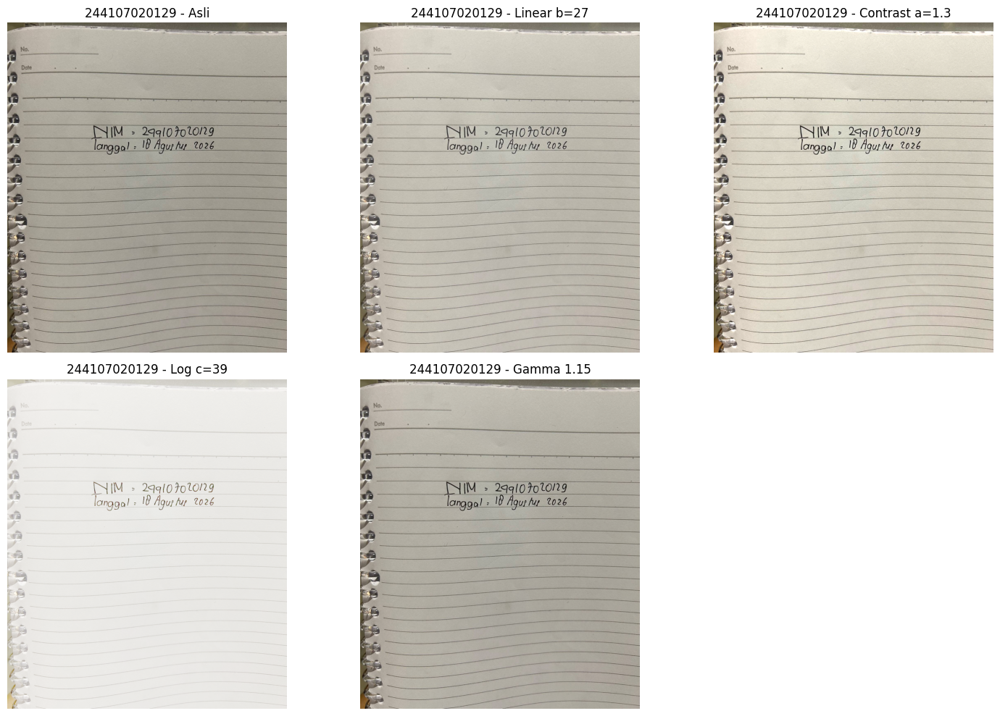

In [20]:
b = PARAM['b']
a = PARAM['a']
c = PARAM['c']
gamma = PARAM['gamma']

night_linear = img_NIGHT1_rgb.astype(np.int16) + b
night_linear = np.clip(night_linear, 0, 255).astype(np.uint8)

night_contrast = a * img_NIGHT1_rgb.astype(np.float32)
night_contrast = np.clip(night_contrast, 0, 255).astype(np.uint8)

night_log = c * np.log1p(
    img_NIGHT1_rgb.astype(np.float32)
)
night_log = cv.normalize(
    night_log,
    None,
    0,
    255,
    cv.NORM_MINMAX
).astype(np.uint8)

normalized_night = img_NIGHT1_rgb.astype(np.float32) / 255.0

night_gamma = 255 * (
    normalized_night ** (1 / gamma)
)

night_gamma = np.clip(
    night_gamma,
    0,
    255
).astype(np.uint8)

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(img_NIGHT1_rgb)
plt.title(NIM + ' - Asli')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(night_linear)
plt.title(NIM + ' - Linear b=' + str(b))
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(night_contrast)
plt.title(NIM + ' - Contrast a=' + str(a))
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(night_log)
plt.title(NIM + ' - Log c=' + str(c))
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(night_gamma)
plt.title(NIM + ' - Gamma ' + str(gamma))
plt.axis('off')

plt.tight_layout()
plt.show()

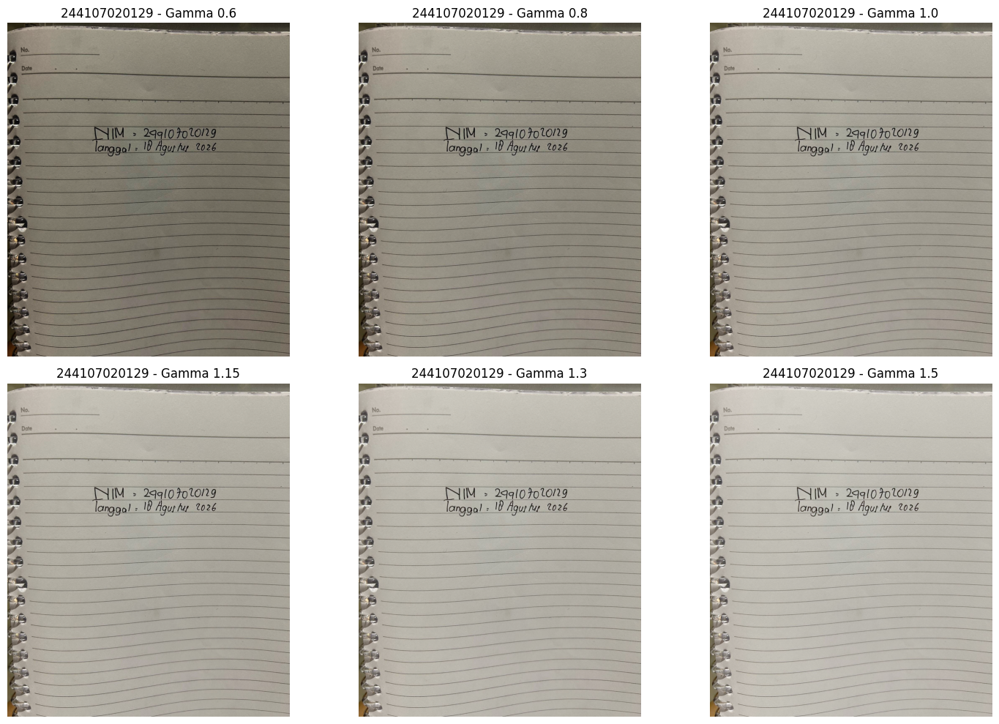

In [21]:
night_gamma_values = [0.6, 0.8, 1.0, 1.15, 1.3, 1.5]

night_gamma_images = []

for gamma_value in night_gamma_values:
    normalized = img_NIGHT1_rgb.astype(np.float32) / 255.0
    result = 255 * (normalized ** (1 / gamma_value))
    result = np.clip(result, 0, 255).astype(np.uint8)
    night_gamma_images.append(result)

plt.figure(figsize=(15, 10))

for i in range(len(night_gamma_values)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(night_gamma_images[i])
    plt.title(
        NIM + ' - Gamma ' +
        str(night_gamma_values[i])
    )
    plt.axis('off')

plt.tight_layout()
plt.show()

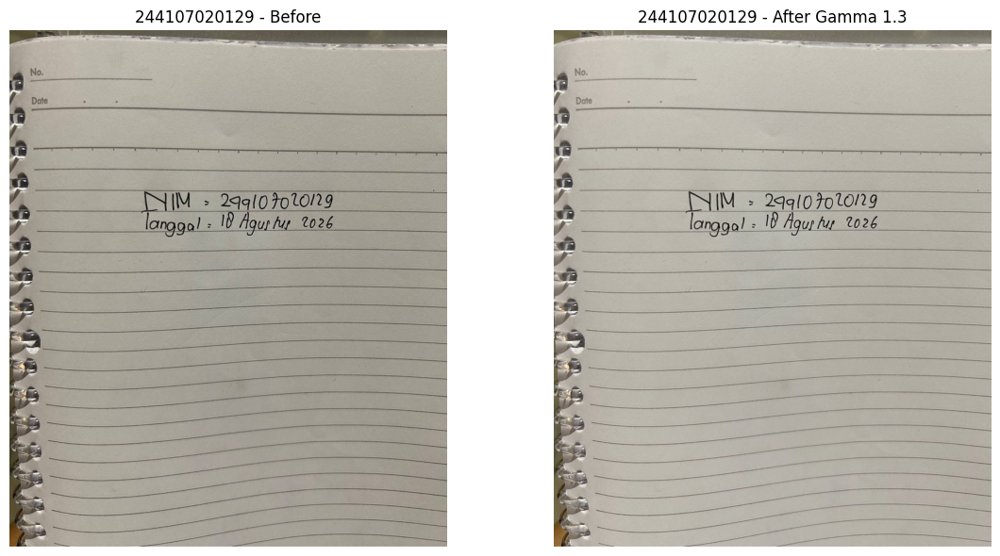

In [22]:
best_gamma = 1.3

normalized = img_NIGHT1_rgb.astype(np.float32) / 255.0

night_best = 255 * (
    normalized ** (1 / best_gamma)
)

night_best = np.clip(
    night_best,
    0,
    255
).astype(np.uint8)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_NIGHT1_rgb)
plt.title(NIM + ' - Before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(night_best)
plt.title(
    NIM + ' - After Gamma ' +
    str(best_gamma)
)
plt.axis('off')

plt.tight_layout()
plt.show()

"Hasil Analisis"

1. Inverse Citra

Hasil inverse pada KTM1a yang diambil dalam kondisi gelap terlihat lebih pucat dan kurang jelas dibandingkan KTM1b. Hal ini karena kondisi awal KTM1a sudah cukup gelap, sehingga setelah nilai pixel dibalik, bagian gelap menjadi lebih terang tetapi detailnya tidak terlalu terlihat. Pada KTM1b hasil inverse masih terlihat lebih jelas karena pencahayaan awalnya lebih baik.

2. Contrast

Pada percobaan ini digunakan nilai a = 1,3 sesuai parameter dari NIM. Hasil contrast membuat perbedaan antara bagian gelap dan terang pada KTM1a menjadi lebih terlihat sehingga beberapa tulisan pada kartu lebih jelas. Namun, peningkatan contrast juga dapat membuat beberapa bagian terang kehilangan detail karena nilainya dibatasi sampai 255.

3. Linear dan Logarithmic Brightness

Linear brightness menggunakan b = 27, sedangkan logarithmic brightness menggunakan c = 39. Dari hasil percobaan, linear brightness membuat gambar menjadi lebih terang secara keseluruhan, sedangkan log lebih membantu meningkatkan bagian yang awalnya memiliki intensitas rendah. Pada hasil ini tidak ditemukan pixel putih penuh, sehingga jumlah clipping yang terdeteksi untuk kedua metode adalah 0 pixel.

4. Grayscale

Tiga metode yang digunakan menghasilkan nilai grayscale yang sedikit berbeda. Dari tabel, luminance memiliki nilai standar deviasi paling besar yaitu 77,11 sehingga perbedaan intensitas pada gambar terlihat lebih jelas dibandingkan averaging dan lightness. Pada hasil gambar, metode luminance juga cukup membantu membedakan tulisan dan background pada KTM1c.

5. HSV

Pada OBJ1, warna dominan yang didapat memiliki Hue sebesar 16. Dengan rentang HSV narrow [6, 80, 50] sampai [26, 255, 255], warna yang dipilih dapat dipertahankan sementara bagian lainnya menjadi grayscale. Saat rentang diperlebar menjadi [0, 50, 40] sampai [41, 255, 255], lebih banyak warna yang mirip ikut terambil, sedangkan rentang tight [11, 120, 80] sampai [21, 255, 255] membuat warna yang dipilih menjadi lebih spesifik.

6. Gamma Correction

Pada KTM1a dicoba lima nilai gamma yaitu 0,75; 0,95; 1,15; 1,35; dan 1,55. Dari hasil gambar, nilai gamma yang lebih besar membuat bagian kartu menjadi lebih terang sehingga tulisan yang awalnya sulit terlihat menjadi lebih jelas. Nilai gamma 1,35 terlihat cukup seimbang karena tulisan sudah lebih mudah dibaca tetapi gambar belum terlalu terang.

7. Image Depth

Hasil image depth dari 1 sampai 7 bit menunjukkan bahwa semakin besar bit depth, detail dan gradasi gambar semakin baik. Pada 1 bit gambar terlihat sangat kasar dan banyak detail yang hilang, sedangkan mulai 2 bit nama dan NIM sudah dapat dibaca walaupun masih kurang jelas. Pada 5 sampai 7 bit hasilnya semakin mendekati gambar grayscale asli.

8. Average Denoising

Hasil average denoising menunjukkan bahwa jumlah citra yang lebih banyak menghasilkan PSNR yang semakin tinggi. PSNR yang diperoleh adalah 19,74 dB untuk 10 citra, 19,84 dB untuk 20 citra, 19,89 dB untuk 40 citra, 19,92 dB untuk 80 citra, dan 19,92 dB untuk 100 citra. Dari hasil tersebut terlihat bahwa setelah jumlah citra semakin banyak, peningkatan PSNR menjadi kecil sehingga penambahan citra tidak selalu memberikan perubahan yang besar.

9. Image Masking

Pada masking KTM1d dibuat mask untuk menutupi bagian wajah dan NIM. Operator NOT menghasilkan kebalikan dari mask, sedangkan OR, AND, NAND, dan XOR menghasilkan tampilan yang berbeda sesuai operasi bitwise masing-masing. Pada hasil AND, bagian wajah dan NIM berhasil ditutup sehingga data pribadi pada kartu tidak terlihat, dengan koordinat wajah 100, 590, 320, 900 dan koordinat NIM 170, 830, 710, 950.

10. Perbaikan NIGHT1

Pada NIGHT1 dilakukan beberapa metode yaitu linear brightness b = 27, contrast a = 1,3, log c = 39, dan gamma 1,15. Dari hasil perbandingan, gamma memberikan perubahan yang lebih terlihat pada bagian gambar yang gelap tanpa membuat keseluruhan gambar terlalu terang. Setelah mencoba beberapa nilai gamma, gamma 1,3 dipilih sebagai hasil akhir karena tulisan pada kertas menjadi lebih mudah terlihat dan pencahayaan gambar masih cukup seimbang.